In [29]:
import os
import numpy as np
import glob
import re
import matplotlib.pyplot as plt
import scipy
import matplotlib.colors as mcolors
from scipy.signal import spectrogram
from matplotlib import gridspec
import pandas as pd


%cd /media/Projects/Adrian/seizureProcessing/
#%cd /Users/adriangutierrezgomez/Documents/seizureProcessing/

from seizureProcessing.utils.loadNCS import *
from seizureProcessing.utils.get_chnames import *
from seizureProcessing.utils.readMatfile import *
from seizureProcessing.lfp.butter_lowpass_filter import *
from seizureProcessing.utils.from_macro_to_micro_names import *
from seizureProcessing.utils.from_micro_to_macro_names import *
from seizureProcessing.utils.get_patinfo_from_path import *

%cd /media/Projects/Adrian/SD_analysis/

from filesystem_handlers import *
from make_basic_dataframe import *
from plotter import *

/media/Projects/Adrian/seizureProcessing
/media/Projects/Adrian/SD_analysis


# 0) Set all paths for data

In [72]:
path = '/media/Seizures/60min_cut/089/2021-04-19_03-43-56/'
#macropath = os.path.join(path, 'macro')
outpath_base= '/media/Seizures/Wenzel/sd_determination_plots/'
dframe_outpath = '/media/Seizures/Wenzel/dataframes_patpool'
pnr, sznr = get_patinfo_from_path(path)
fname = f'patdata_{pnr}_{sznr}.pkl'
outpath =  os.path.join(outpath_base, pnr+'_'+sznr)
#plot_outpath = os.path.join(outpath, pnr+'_'+sznr)
if not os.path.exists(outpath):
    print('making directory:', outpath)
    os.mkdir(outpath)
#plt_spath = os.path.join(outpath, 'seizure_onset_plots')
#plt_spath_macro= os.path.join(os.path.join(plt_spath,'macro'))

# 1) Load dataframe if existing, otherwise generate dataframe

In [73]:
if os.path.isfile(os.path.join(dframe_outpath, fname)):
    print('loaded dataframe:')
    load_df = pd.read_pickle(os.path.join(dframe_outpath, fname))
else:
    print(f'created dataframe and saved in {dframe_outpath}:')
    dataDf = make_basic_dataframe(os.path.join(dframe_outpath, fname))
    #modifyValueToDataframe(dataDf, val=1, col='seizureinvaded')
    dataDf.to_pickle(os.path.join(dframe_outpath, fname))  
    
load_df

loaded dataframe:


,pnr,sznr,datapath,chname,region,hemisphere,sf,SO_sec,fname,seizureinvaded
0,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA1,LA,L,1000,1800,CSC1.ncs,1
1,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA2,LA,L,1000,1800,CSC2.ncs,1
2,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA3,LA,L,1000,1800,CSC3.ncs,1
3,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA4,LA,L,1000,1800,CSC4.ncs,1
4,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA5,LA,L,1000,1800,CSC5.ncs,1
...,...,...,...,...,...,...,...,...,...,...
91,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,RPIC4,RPIC,R,1000,1800,CSC92.ncs,0
92,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,RPIC5,RPIC,R,1000,1800,CSC93.ncs,0
93,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,RPIC6,RPIC,R,1000,1800,CSC94.ncs,0
94,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,RPIC7,RPIC,R,1000,1800,CSC95.ncs,0


In [74]:
sd_invaded_regions = np.unique(load_df[load_df['sdinvaded_region'] == 1]['region']).tolist()
sd_invaded_regions

KeyError: 'sdinvaded_region'

# 2) Plot initial SD prediction

In [26]:
#PARAMS
sd_seconds = (31*60) +44
sf = 1000

save = True if 'sdinvaded_ch' not in load_df.keys() else False
print('save set to:', save)

save set to: True


saving plot LA_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


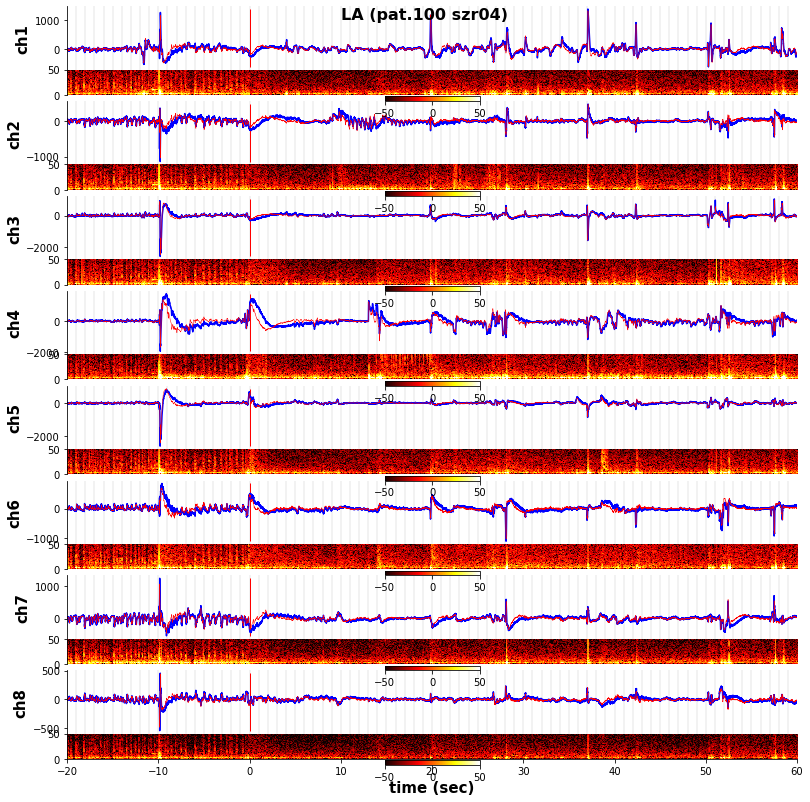

saving plot LAH_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


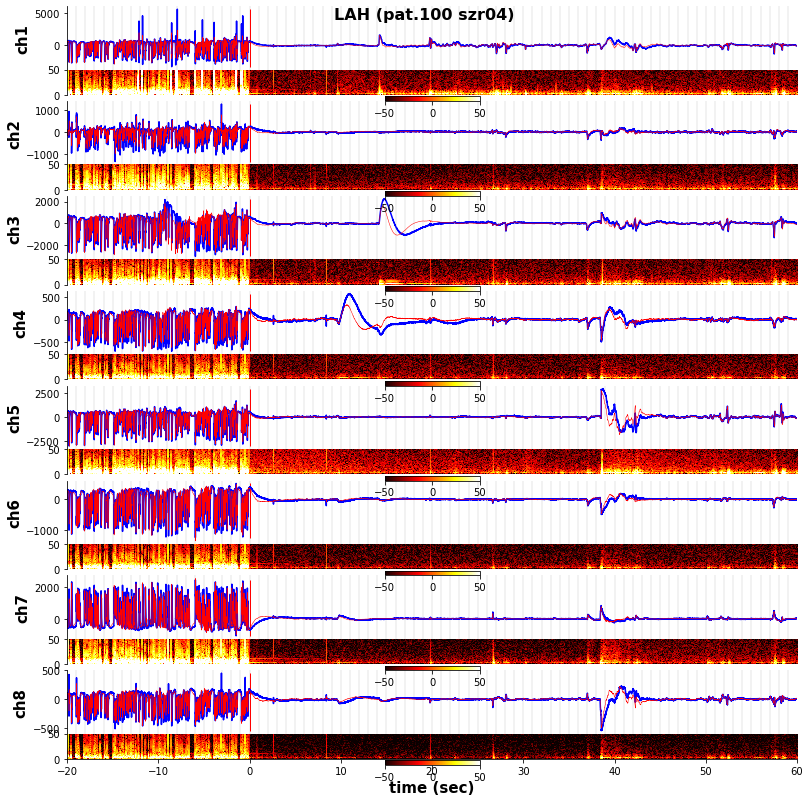

saving plot LEC_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


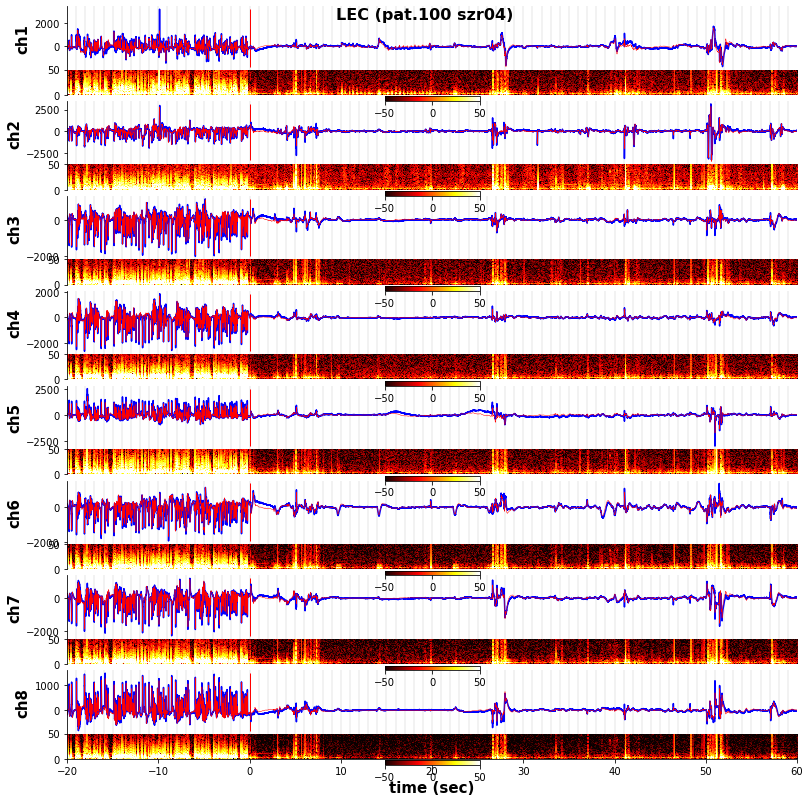

saving plot LMH_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


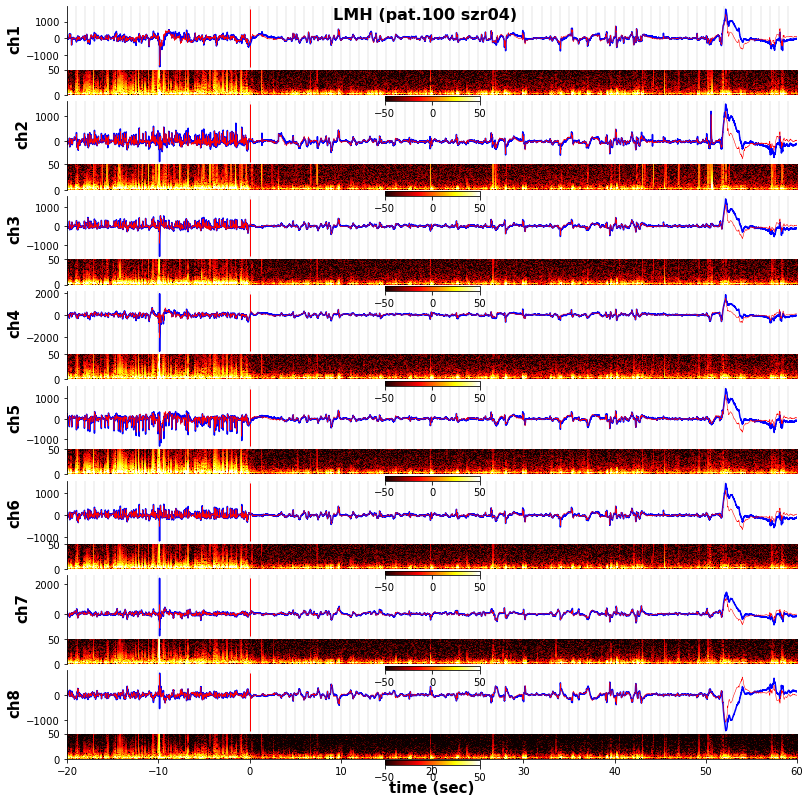

saving plot LPHC_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


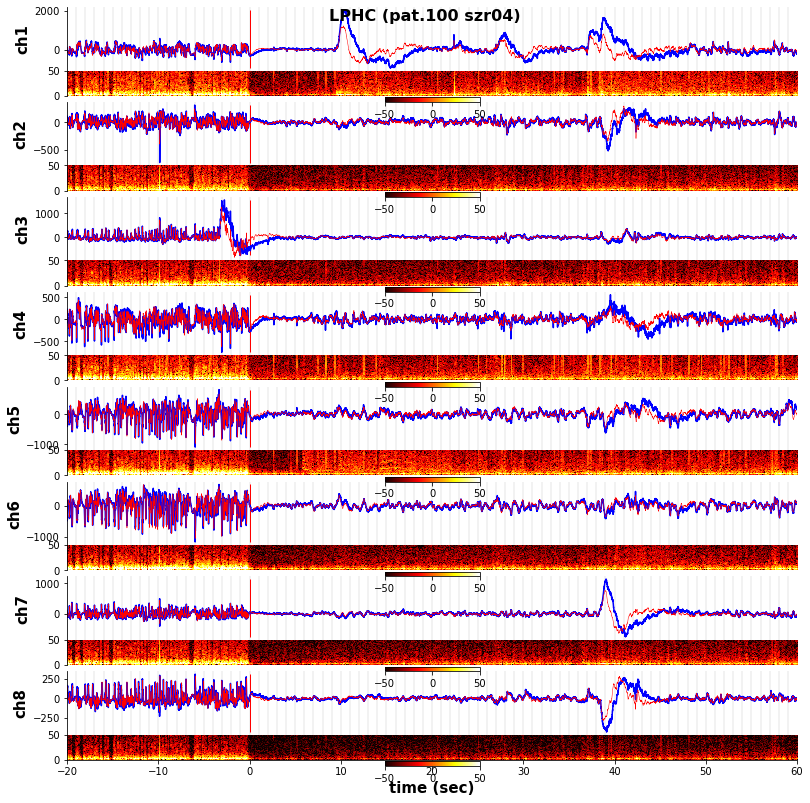

saving plot RA_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


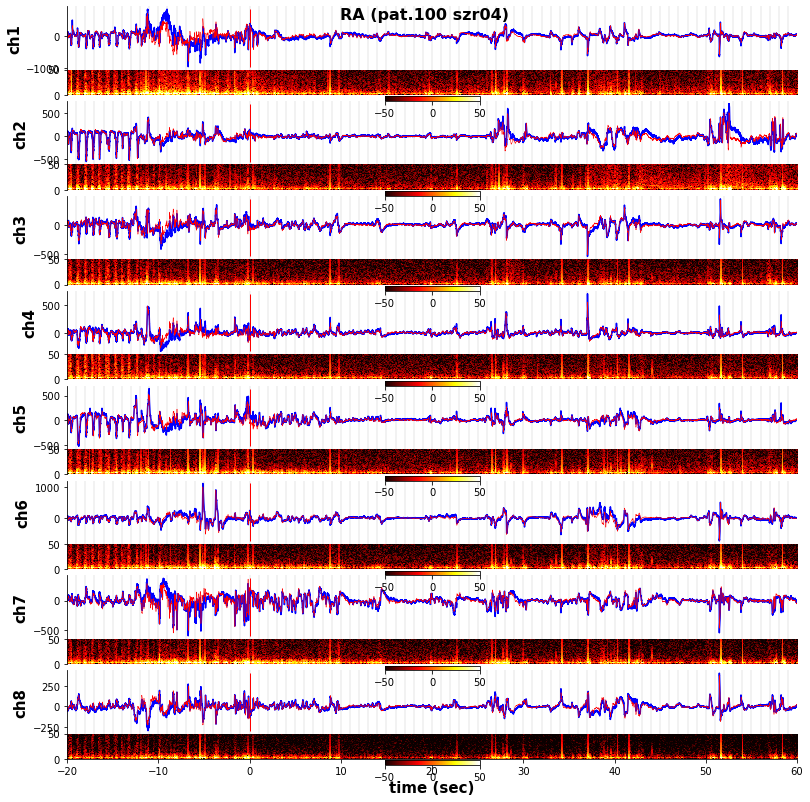

saving plot RAH_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


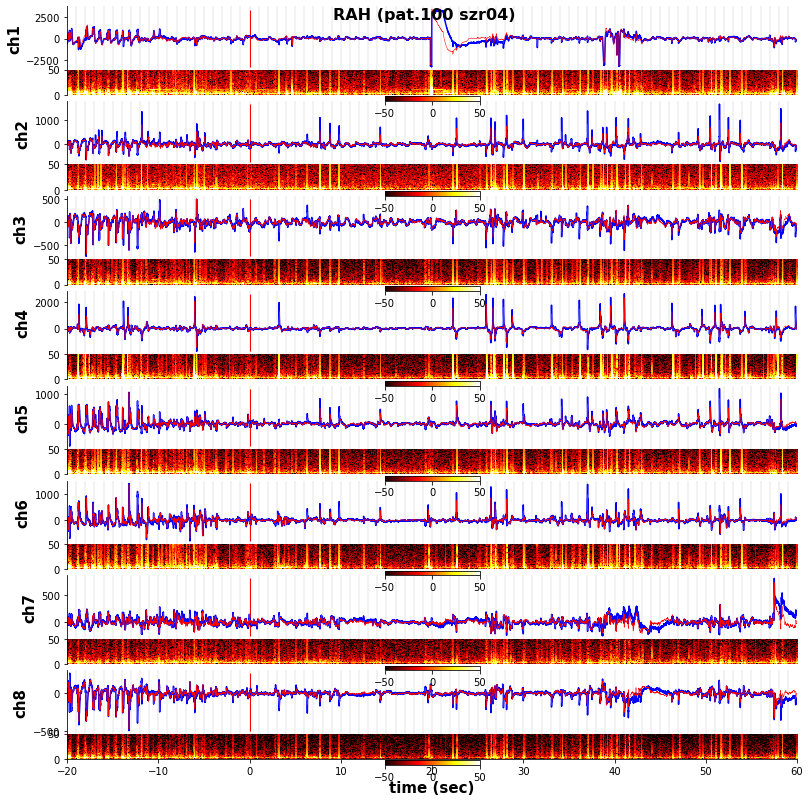

saving plot REC_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


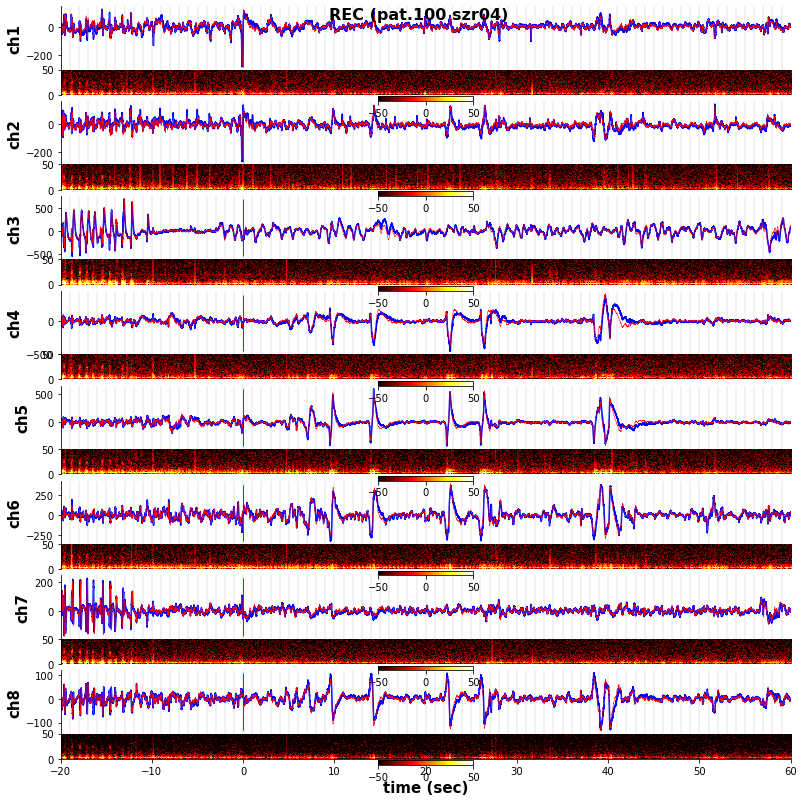

saving plot RFa_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


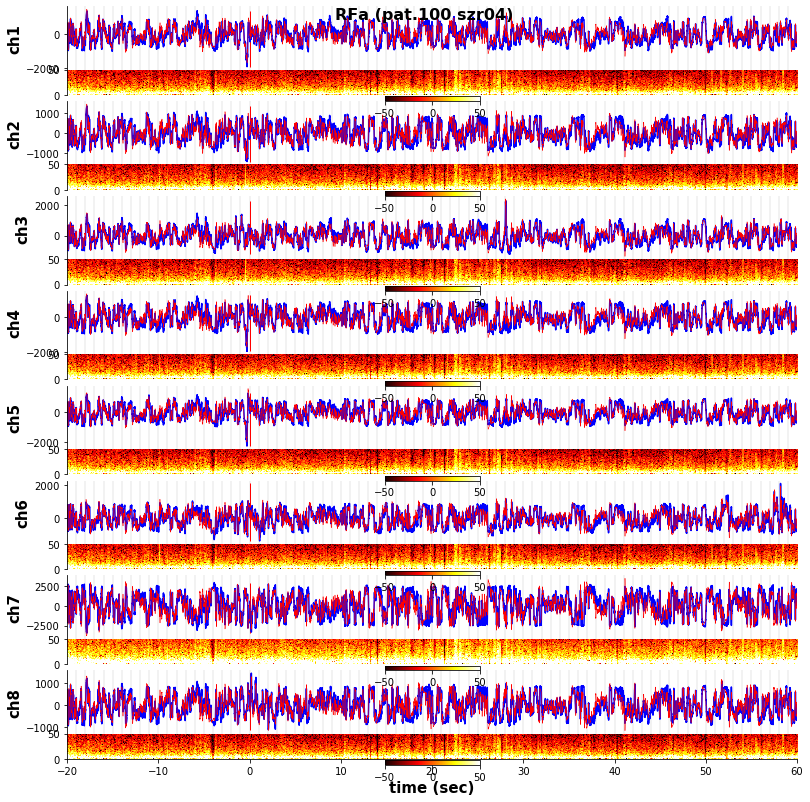

saving plot RFb_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


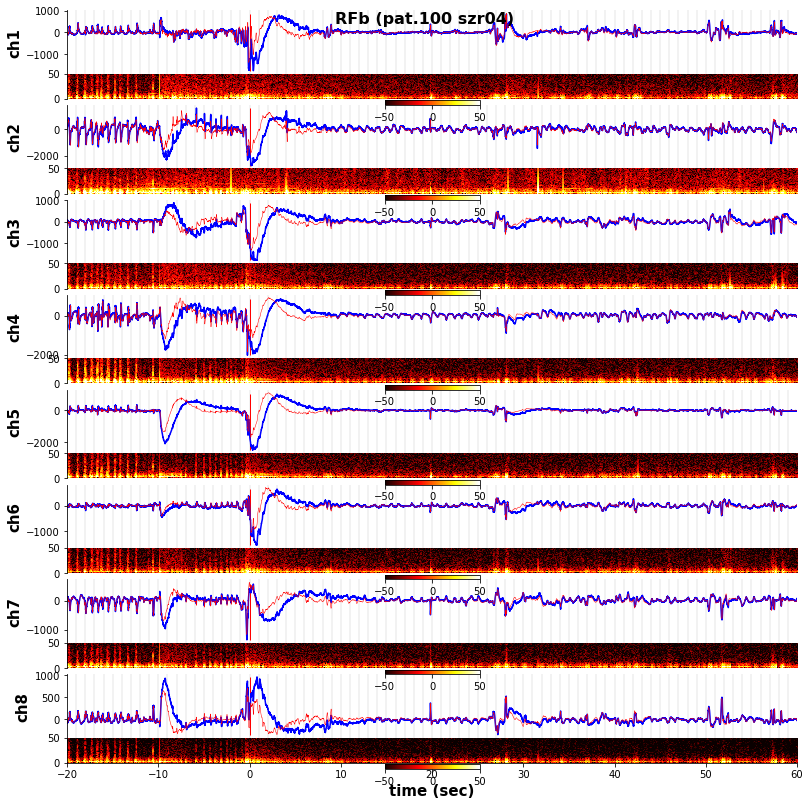

saving plot RFc_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


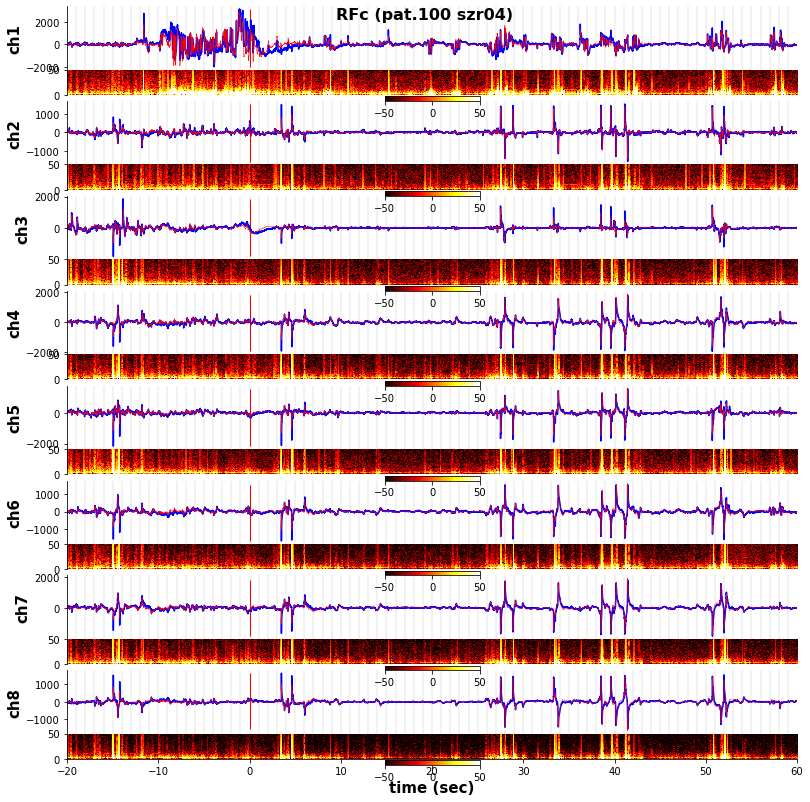

saving plot RMH_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


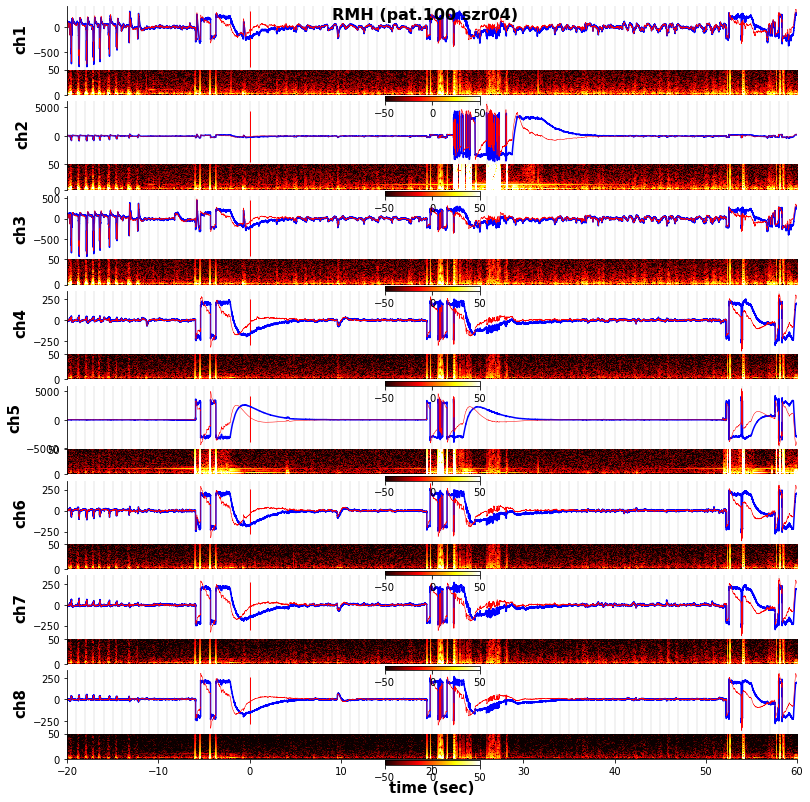

saving plot RPHC_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


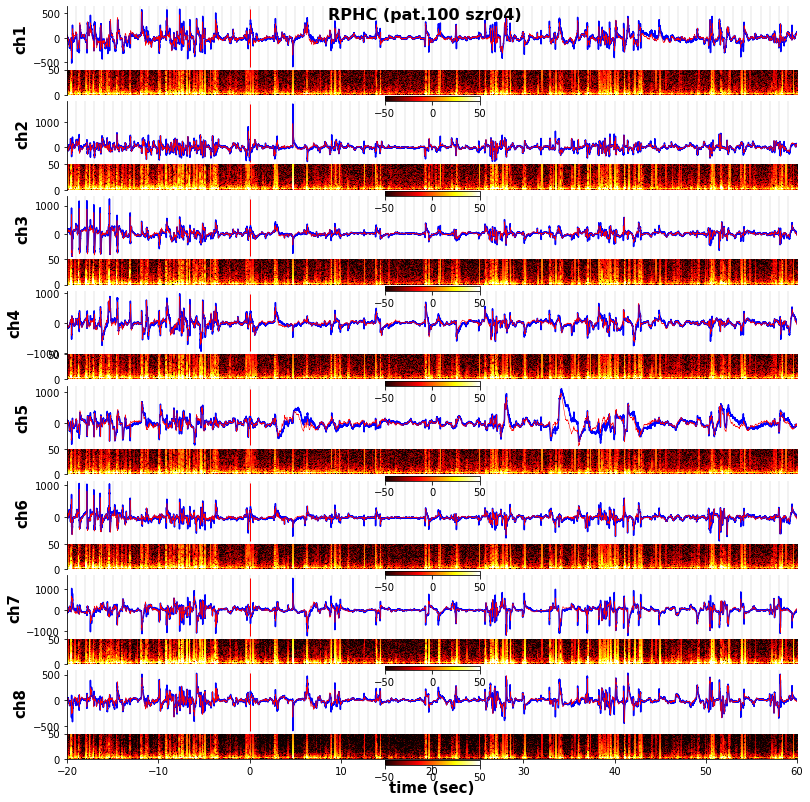

saving plot RT_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_so_determination


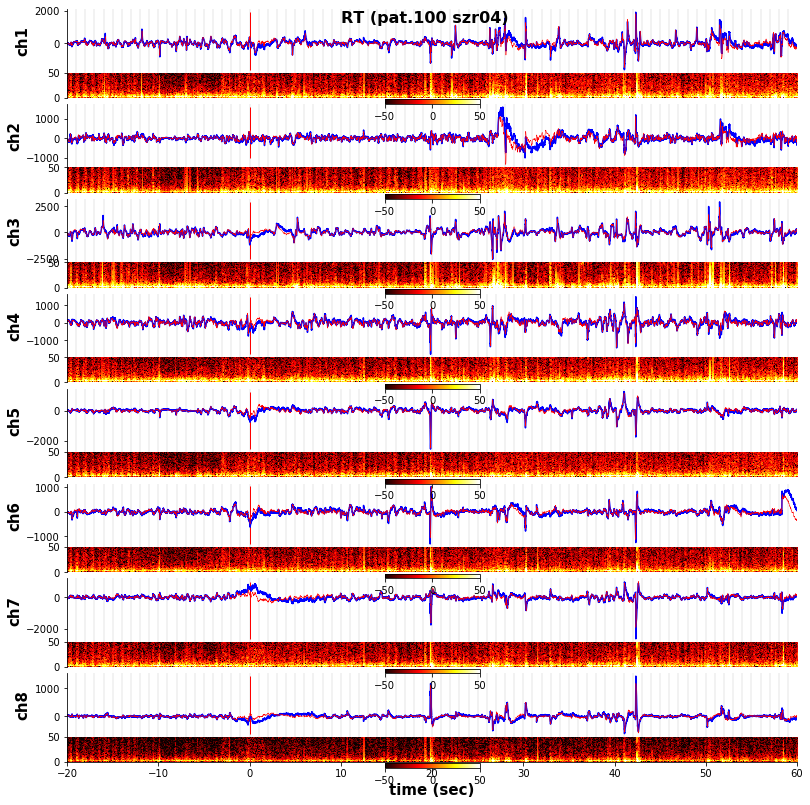

saving plot LA_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


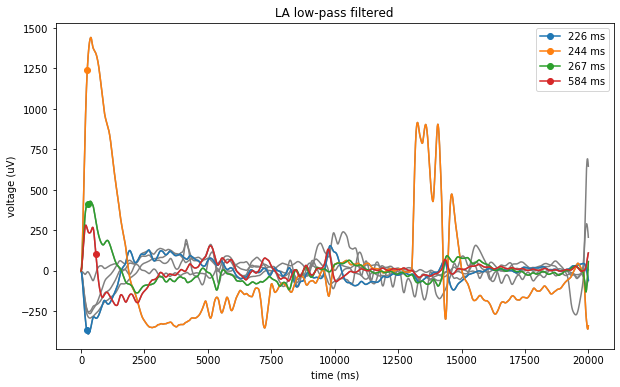

saving plot LAH_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


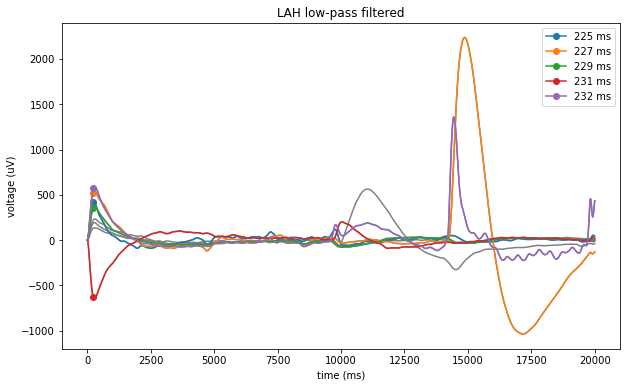

saving plot LEC_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


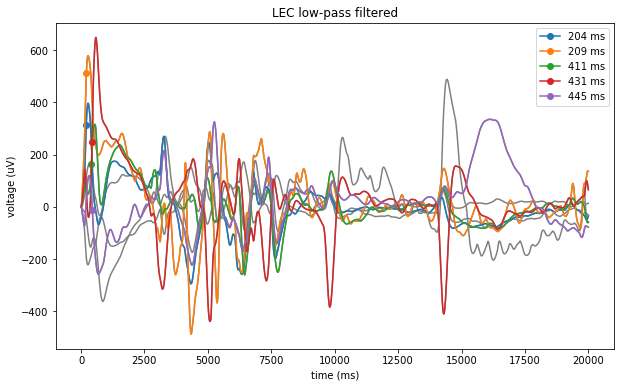

saving plot LMH_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


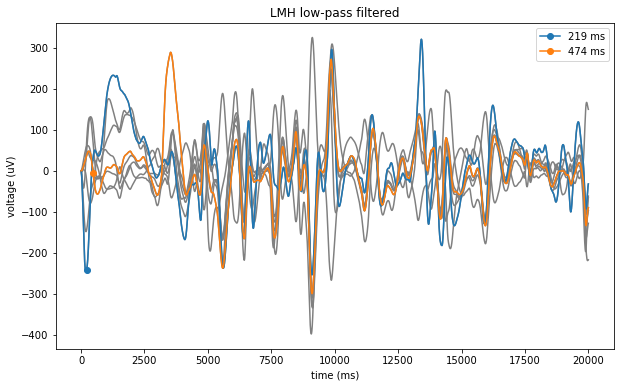

saving plot LPHC_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


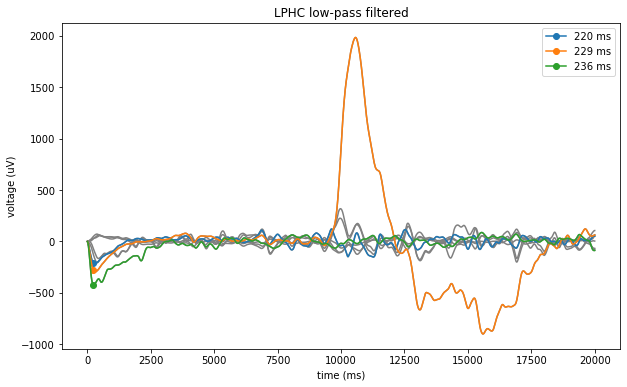

saving plot RA_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


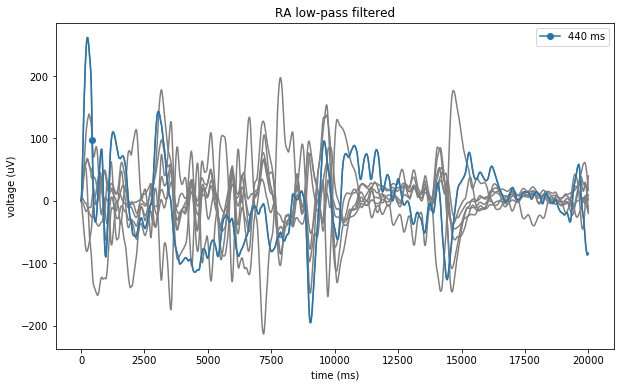

saving plot RAH_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


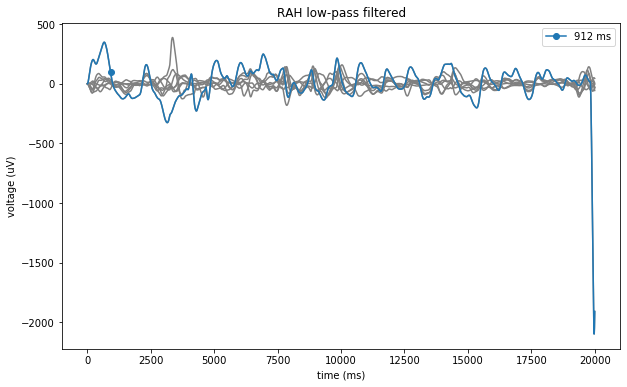

saving plot REC_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


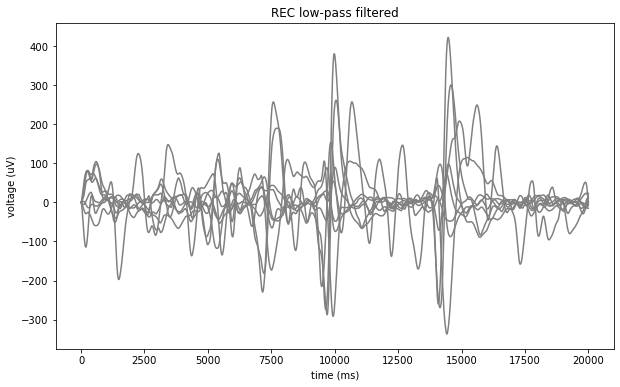

saving plot RFa_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


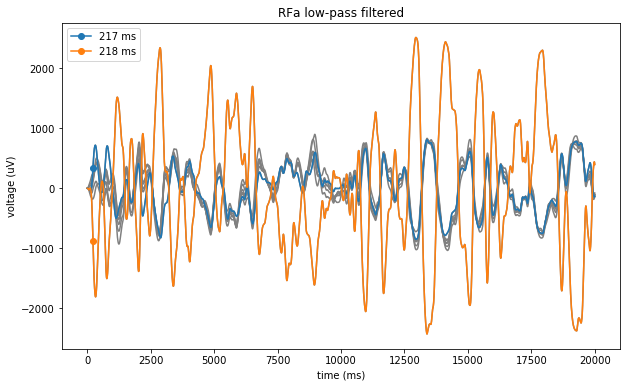

saving plot RFb_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


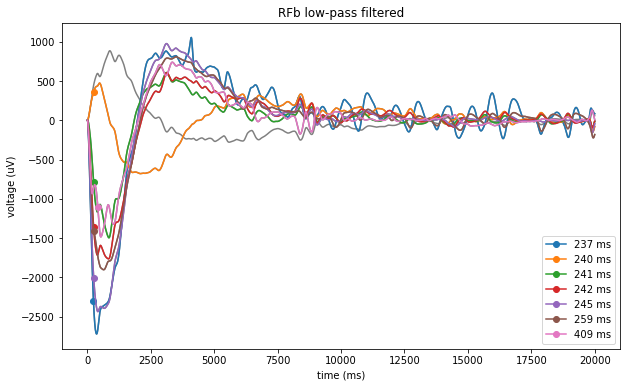

saving plot RFc_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


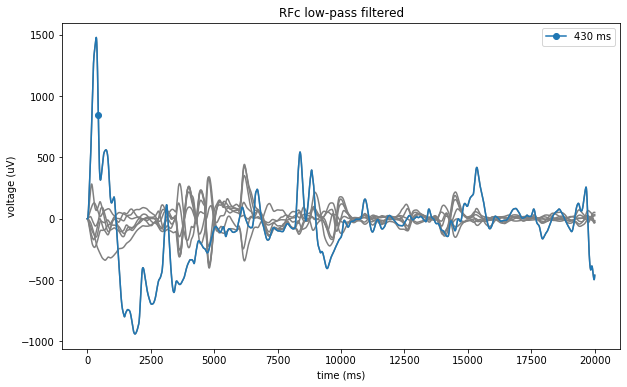

saving plot RMH_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


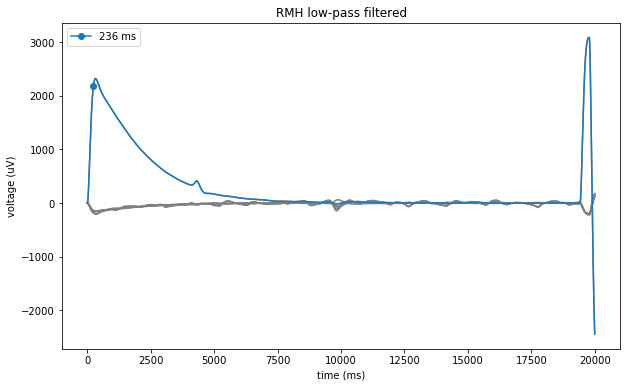

saving plot RPHC_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


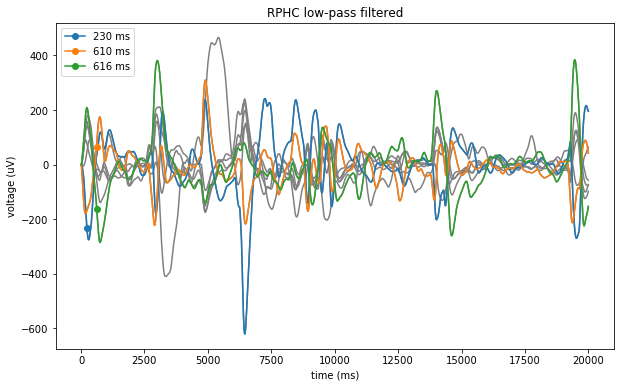

saving plot RT_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/100_04/plots_sd_regions


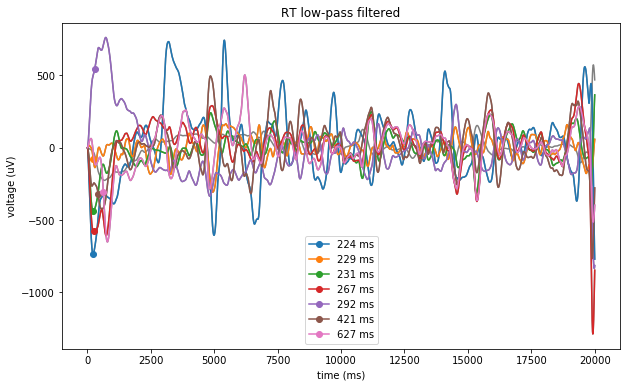

In [27]:
#plot all plots
plot_determine_onset_regions(path, 
                             so_sec=sd_seconds, 
                             sf=sf, 
                             sec_before=20, 
                             sec_after=60, 
                             fmin=0, fmax=50, 
                             plot_filt=True, 
                             region_list=None, 
                             figlabel='_sdonset', 
                             save=save, 
                             savepath=outpath)
wd = plot_sd_filtered_region(path, 
                             sd_onset_sec=sd_seconds, 
                             sf=sf, 
                             sec_after=20, 
                             adjust_ms=150, 
                             order=2, 
                             cutoff=2, 
                             reg_list=None, 
                             figlabel=None, 
                             save=save, 
                             savepath=outpath)

# 3) Plot region of interest, possibly with modified SD

In [75]:
#loading data 
load_df = pd.read_pickle(os.path.join(dframe_outpath, fname))
regions = load_df['region'].unique().tolist()
regions_dic = {i:x for i,x in enumerate(regions)}
print('regions:\n',regions_dic)

regions:
 {0: 'LA', 1: 'LAH', 2: 'LEC', 3: 'LMH', 4: 'LPHC', 5: 'LPIC', 6: 'RA', 7: 'RAH', 8: 'REC', 9: 'RMH', 10: 'RPHC', 11: 'RPIC'}


In [82]:
#Change for plotting or saving df
save_plot=False
save_df =False
reg = 'LA'
delta_sec = 0
duration_sec = 5
sd_seconds = (31*60)-5


sf = 1000
s_before = 20
s_after= 60
fmax = 50
adjust_ms = 500

roi = [reg] if type(reg)==str else [regions_dic[reg]]
#delta_sec = 0
#duration_sec = 0
termination=False if duration_sec == 0 else True
adjusted_onset = sd_seconds + delta_sec

if (duration_sec != False) or (duration_sec != 0):
    termination = adjusted_onset + duration_sec
#termination

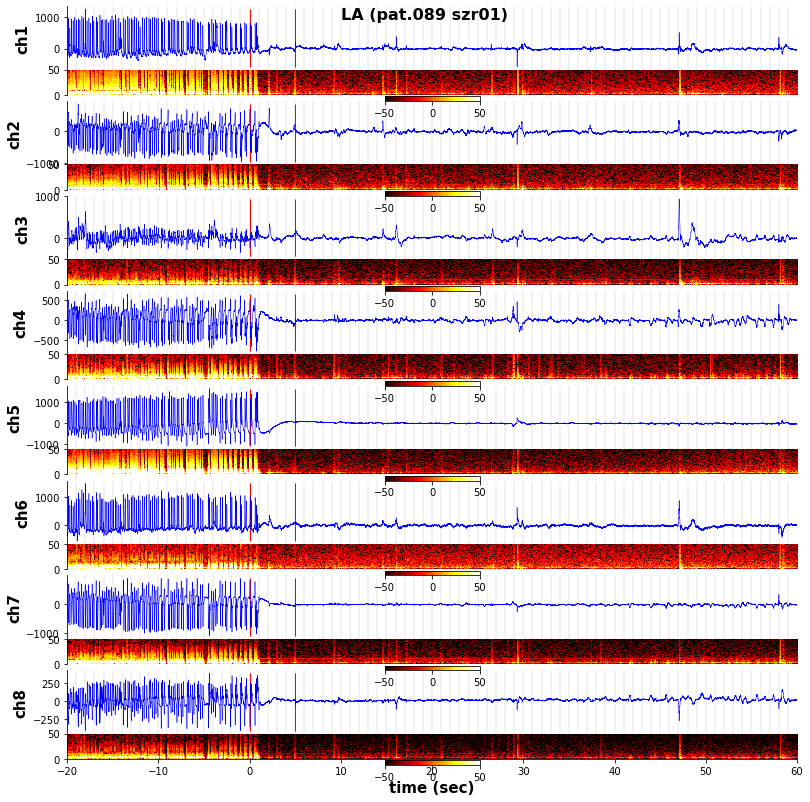

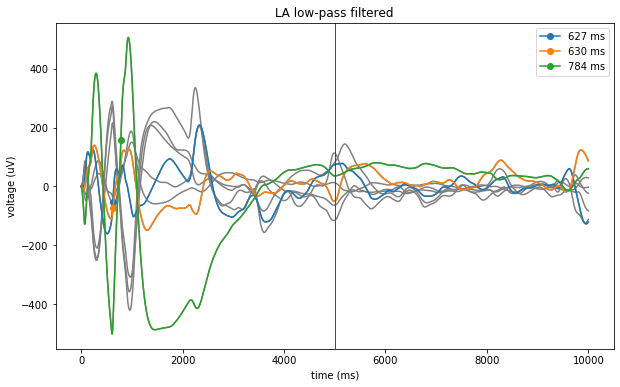

,pnr,sznr,datapath,chname,region,hemisphere,sf,SO_sec,fname,seizureinvaded
0,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA1,LA,L,1000,1800,CSC1.ncs,1
1,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA2,LA,L,1000,1800,CSC2.ncs,1
2,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA3,LA,L,1000,1800,CSC3.ncs,1
3,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA4,LA,L,1000,1800,CSC4.ncs,1
4,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA5,LA,L,1000,1800,CSC5.ncs,1
5,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA6,LA,L,1000,1800,CSC6.ncs,1
6,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA7,LA,L,1000,1800,CSC7.ncs,1
7,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA8,LA,L,1000,1800,CSC8.ncs,1


In [83]:
#plot region of interest
plot_determine_onset_regions(path, 
                             so_sec=adjusted_onset, 
                             sf=sf, 
                             sec_before=s_before, 
                             sec_after=s_after, 
                             fmin=0, fmax=fmax, 
                             plot_filt=False, 
                             region_list=roi, 
                             figlabel='_sdonset', 
                             save=False, 
                             savepath=False,
                            duration_sec=duration_sec)

wd, idx_sd = plot_sd_filtered_region(path, 
                             sd_onset_sec=adjusted_onset, 
                             sf=sf, 
                             sec_after=10, 
                             adjust_ms=adjust_ms, 
                             order=2, 
                             cutoff=2, 
                             reg_list=roi, 
                             figlabel=None, 
                             save=False, 
                             savepath=False,
                            duration_sec=duration_sec)

load_df[load_df['region'] == roi[0]]

# save corrected sd onset and data into dataframe, plot as well

In [84]:
channels_with_sd = [x.split('_')[0]+'.ncs' for x in idx_sd[roi[0]]]

sd_channels_dic = {}
wires_with_sd = len(channels_with_sd)
channels_with_sd, wires_with_sd

(['CSC1.ncs', 'CSC5.ncs', 'CSC6.ncs'], 3)

In [85]:
#load_df = load_df.drop(columns=['sdend_sec'])

#update dataframe

if wires_with_sd:
    modifyValueToDataframe(load_df, 
                       val=1, 
                       col='sdinvaded_ch', 
                       key=channels_with_sd, 
                       key_col='fname')


    modifyValueToDataframe(load_df,
                               val=adjusted_onset+1,
                               col='sdonset_sec',
                               key=channels_with_sd,
                               key_col='fname')

    if termination:
        #print('writi')
        modifyValueToDataframe(load_df,
                               val=termination,
                               col='sdend_sec',
                               key=channels_with_sd,
                               key_col='fname')
    if wires_with_sd>=3:
        modifyValueToDataframe(load_df,
                               val=1,
                               col='sdinvaded_region',
                               key=roi,
                               key_col='region')
        if termination:
            #print('writi')
            modifyValueToDataframe(load_df,
                                   val=termination,
                                   col='sdend_sec',
                                   key=roi,
                                   key_col='region')
    else:
        modifyValueToDataframe(load_df,
                           val=0,
                           col='sdinvaded_region',
                           key=roi,
                           key_col='region')
#save dataframe

load_df.to_pickle(os.path.join(dframe_outpath, fname))
load_df = pd.read_pickle(os.path.join(dframe_outpath, fname))
load_df[load_df['region'] == roi[0]]

,pnr,sznr,datapath,chname,region,hemisphere,sf,SO_sec,fname,seizureinvaded,sdinvaded_ch,sdonset_sec,sdend_sec,sdinvaded_region
0,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA1,LA,L,1000,1800,CSC1.ncs,1,1,1856,1860,1
1,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA2,LA,L,1000,1800,CSC2.ncs,1,,,1860,1
2,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA3,LA,L,1000,1800,CSC3.ncs,1,,,1860,1
3,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA4,LA,L,1000,1800,CSC4.ncs,1,,,1860,1
4,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA5,LA,L,1000,1800,CSC5.ncs,1,1,1856,1860,1
5,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA6,LA,L,1000,1800,CSC6.ncs,1,1,1856,1860,1
6,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA7,LA,L,1000,1800,CSC7.ncs,1,,,1860,1
7,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA8,LA,L,1000,1800,CSC8.ncs,1,,,1860,1


saving plot LTb_so_determiation_sdonset in /media/Seizures/Wenzel/sd_determination_plots/092_03/plots_so_determination


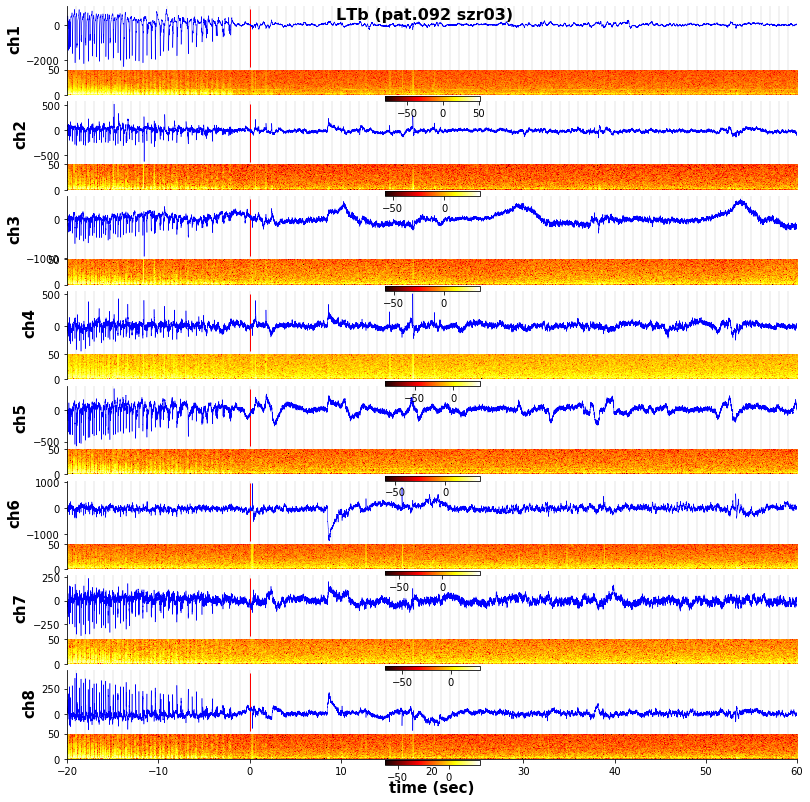

saving plot LTb_sd_determiation in /media/Seizures/Wenzel/sd_determination_plots/092_03/plots_sd_regions


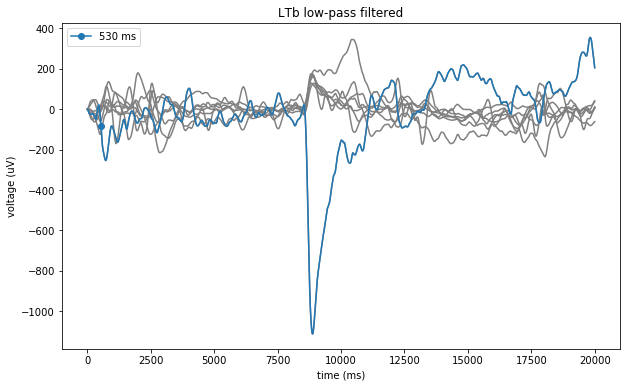

In [67]:
#save plots
duration_plotted = True if wires_with_sd>=3 else False

plot_determine_onset_regions(path, 
                             so_sec=adjusted_onset, 
                             sf=sf, 
                             sec_before=20, 
                             sec_after=60, 
                             fmin=0, fmax=50, 
                             plot_filt=False, 
                             region_list=roi, 
                             figlabel='_sdonset', 
                             save=True, 
                             savepath=outpath,
                            duration_sec=duration_sec if duration_plotted==True else False)

wd, idx = plot_sd_filtered_region(path, 
                             sd_onset_sec=adjusted_onset, 
                             sf=sf, 
                             sec_after=20, 
                             adjust_ms=150, 
                             order=2, 
                             cutoff=2, 
                             reg_list=roi, 
                             figlabel=None, 
                             save=True, 
                             savepath=outpath,
                            duration_sec=duration_sec if duration_plotted==True else False)

In [86]:
load_df[load_df['sdinvaded_region']==1]

,pnr,sznr,datapath,chname,region,hemisphere,sf,SO_sec,fname,seizureinvaded,sdinvaded_ch,sdonset_sec,sdend_sec,sdinvaded_region
0,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA1,LA,L,1000,1800,CSC1.ncs,1,1,1856,1860,1
1,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA2,LA,L,1000,1800,CSC2.ncs,1,,,1860,1
2,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA3,LA,L,1000,1800,CSC3.ncs,1,,,1860,1
3,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA4,LA,L,1000,1800,CSC4.ncs,1,,,1860,1
4,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA5,LA,L,1000,1800,CSC5.ncs,1,1,1856,1860,1
5,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA6,LA,L,1000,1800,CSC6.ncs,1,1,1856,1860,1
6,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA7,LA,L,1000,1800,CSC7.ncs,1,,,1860,1
7,089,01,/media/Seizures/60min_cut/089/2021-04-19_03-43...,LA8,LA,L,1000,1800,CSC8.ncs,1,,,1860,1


# Remove region from SD invaded

In [62]:
modifyValueToDataframe(load_df,
                   val=0,
                   col='sdinvaded_region',
                   key=roi,
                   key_col='region')


#save dataframe

load_df.to_pickle(os.path.join(dframe_outpath, fname))
load_df = pd.read_pickle(os.path.join(dframe_outpath, fname))
load_df[load_df['region'] == roi[0]]

,pnr,sznr,datapath,chname,region,hemisphere,sf,SO_sec,fname,SO_index,seizureinvaded,sdinvaded_region,sdinvaded_ch,sdend_sec,sdonset_sec
24,092,03,/media/Seizures/60min_cut/092/2021-09-21_08-52...,LMH1,LMH,L,1000,1800,CSC25.ncs,1800000.0,1.0,0,1.0,1879,1871
25,092,03,/media/Seizures/60min_cut/092/2021-09-21_08-52...,LMH2,LMH,L,1000,1800,CSC26.ncs,1800000.0,1.0,0,1.0,1879,1871
26,092,03,/media/Seizures/60min_cut/092/2021-09-21_08-52...,LMH3,LMH,L,1000,1800,CSC27.ncs,1800000.0,1.0,0,0.0,1879,
27,092,03,/media/Seizures/60min_cut/092/2021-09-21_08-52...,LMH4,LMH,L,1000,1800,CSC28.ncs,1800000.0,1.0,0,1.0,1879,1871
28,092,03,/media/Seizures/60min_cut/092/2021-09-21_08-52...,LMH5,LMH,L,1000,1800,CSC29.ncs,1800000.0,1.0,0,0.0,1879,
29,092,03,/media/Seizures/60min_cut/092/2021-09-21_08-52...,LMH6,LMH,L,1000,1800,CSC30.ncs,1800000.0,1.0,0,0.0,1879,
30,092,03,/media/Seizures/60min_cut/092/2021-09-21_08-52...,LMH7,LMH,L,1000,1800,CSC31.ncs,1800000.0,1.0,0,1.0,1879,1871
31,092,03,/media/Seizures/60min_cut/092/2021-09-21_08-52...,LMH8,LMH,L,1000,1800,CSC32.ncs,1800000.0,1.0,0,0.0,1879,


# convert patient dataframe to csv file

In [120]:
load_df.to_csv(os.path.join(outpath,fname.split('.')[0]+'.csv'), encoding='utf-16')